# Different speeds

In [1]:
import warnings

warnings.filterwarnings('ignore')
%config InlineBackend.figure_formats = ['svg']

## Scenario

Contrary to the previous notebook, in this notebook agents are assigned, at initialization, *individual* target speeds sampled in `[0.03, 0.12]`.

In order to set consistent target angular and linear speeds, we add an initializer to the scenario that set the behavior's `optimal_angular_speed` to the maximal angular speed achievable with a maximal linear wheel speed of `optimal_speed`.

In [2]:
from navground import sim

scenario = sim.load_scenario("""
type: CrossTorus
agent_margin: 0.1
side: 2
groups:
  -
    type: thymio
    number: 10
    radius: 0.1
    control_period: 0.1
    speed_tolerance: 0.02
    color: [red, green, blue, yellow]
    kinematics:
      type: 2WDiff
      wheel_axis: 0.094
      max_speed: 0.12
    behavior:
      type: HL
      horizon: 5.0
      tau: 0.25
      eta: 0.5
      safety_margin: 0.1
      barrier_angle: 1.0
      optimal_speed:
        sampler: uniform
        from: 0.03
        to: 0.12
    state_estimation:
      type: Bounded
      range: 1.0
""")

def set_optimal_angular_speed(world: sim.World, seed: int | None = None) -> None:
    for agent in world.agents:
        agent.behavior.optimal_angular_speed = 2 * agent.behavior.optimal_speed / agent.kinematics.wheel_axis

scenario.set_init('angular_speed', set_optimal_angular_speed)

The video below shows `HL` agents navigating in this scenario. Agents are colored by their target speed (red=lower), which is sampled at the begin of the run, and then kept constant.

In [3]:
from navground.sim.ui.video import display_video_from_run, display_video
from navground.sim.ui import svg_color

def decorate(agent):
    f = agent.behavior.optimal_speed / 0.12
    return {'fill': svg_color(1 - f, f, 0.1)}

world = scenario.make_world(seed=1)
display_video(world, time_step=0.1, duration=60.0, factor=5, display_width=400, decorate=decorate)

## Environment

In order to make the agents respect their target speed, we add a term to the reward that penalizes excessive speeds, while lower speeds are already penalized by a descrease in efficacy.

In [4]:
import dataclasses as dc
from navground.learning.rewards import SocialReward
import numpy as np


@dc.dataclass
class RewardWithSpeeding(SocialReward):
    gamma: float = 1.0
    """The weight of speeding"""
    
    def __call__(self, agent: sim.Agent, world: sim.World,
                 time_step: float) -> float:
        reward = super().__call__(agent, world, time_step)
        if agent.behavior:
            target_speed = agent.behavior.get_target_speed()
            target_angular_speed = agent.behavior.get_target_angular_speed()
            speed = np.linalg.norm(agent.velocity)
            angular_speed = abs(agent.angular_speed)
            if speed > target_speed:
                reward += self.gamma * (target_speed - speed) / target_speed
            if angular_speed > target_angular_speed:
                reward += self.gamma * (target_angular_speed - angular_speed) / target_angular_speed
        return reward

We also include tha target speed in the observation. 

Apart from these changes, we use the same configuration as in the previous notebook.

In [5]:
from navground.learning import ControlActionConfig, DefaultObservationConfig
from navground.learning.parallel_env import shared_parallel_env, make_vec_from_penv
from navground.learning import io

sensor = sim.load_state_estimation("""
type: Discs
number: 5
range: 1.0
max_speed: 0.12
max_radius: 0
""")

reward = RewardWithSpeeding(safety_margin=0.1, beta=2.0, gamma=2.0)
action_config = ControlActionConfig(max_acceleration=1.0, max_angular_acceleration=10.0, 
                                    use_acceleration_action=True)
observation_config = DefaultObservationConfig(include_target_direction=True, include_target_speed=True,
                                              include_velocity=True, include_angular_speed=True, flat=True)
penv = shared_parallel_env(scenario=scenario, sensor=sensor, action=action_config, 
                           observation=observation_config, reward=reward, 
                           time_step=0.1, max_duration=120)
venv = make_vec_from_penv(penv)
io.save_env(penv, "different_speed_env.yaml")

We compute the performance of `HL` in this environment

In [6]:
from navground.learning.evaluation import evaluate_policy

mean = {}
stddev = {}

mean['HL'], stddev['HL'] = evaluate_policy(penv.get_policy(0), venv, n_eval_episodes=100)
print(f"HL reward: {mean['HL'] / 1200: .3f} ± {stddev['HL'] / 1200: .3f}")

HL reward: -0.097 ±  0.034


## Training

In [7]:
from stable_baselines3 import SAC
from stable_baselines3.common.vec_env import VecMonitor
from stable_baselines3.common.logger import configure
from datetime import datetime as dt

stamp = dt.now().strftime("%Y%m%d_%H%M%S")
train_venv = VecMonitor(venv)
sac = SAC("MlpPolicy", train_venv, policy_kwargs={'net_arch': [128, 128]})
sac.set_logger(configure(f'logs/DifferentSpeed/SAC/{stamp}', ["tensorboard", "csv"]))

In [8]:
sac.learn(total_timesteps=3_000_000, progress_bar=True, log_interval=25, reset_num_timesteps=False)
sac.save("DifferentSpeed/SAC/model")

Output()

The policy is learn in about 2.5M steps (i.e., 3.5 h of simulated time).

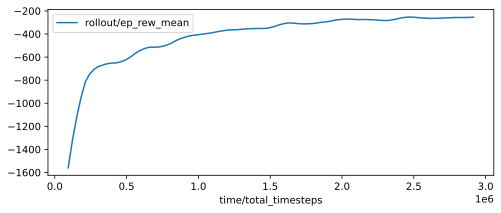

In [9]:
import pandas as pd

df = pd.read_csv(f'{sac.logger.get_dir()}/progress.csv')
df.rolling(window=5).mean().plot(x='time/total_timesteps', y='rollout/ep_rew_mean', figsize=(8, 3));

with a performance

In [10]:
mean['SAC'], stddev['SAC'] = evaluate_policy(sac.policy, venv, n_eval_episodes=100)
print(f"SAC reward: {mean['SAC'] / 1200: .3f} ± {stddev['SAC'] / 1200: .3f}")

SAC reward: -0.211 ±  0.062


In [11]:
pd.set_option("display.precision", 3)
rewards = pd.DataFrame({"mean": mean, "std dev": stddev})
rewards.index = rewards.index.set_names(['algorithm'])
rewards /= 1200
rewards.to_csv("different_speed_rewards.csv")
rewards

,mean,std dev
algorithm,,
HL,-0.097,0.034
SAC,-0.211,0.062


Let us visualize one episode as usual

In [12]:
from navground.learning.evaluation import make_experiment_with_env

exp = make_experiment_with_env(penv, policy=sac.policy, record_reward=False)
exp.record_config.pose = True
exp.number_of_runs = 1
exp.run_index = 3
exp.steps = 1200
exp.run()
display_video_from_run(exp.runs[3], factor=5, relative_margin=0, 
                       display_width=400, display_shape=False, decorate=decorate)

and plot the episode rewards distributions

In [13]:
exp = make_experiment_with_env(penv, policy=sac.policy)
exp.number_of_runs = 30
exp.run()
rewards = np.asarray([run.get_record("reward") for run in exp.runs.values()])
sac_rewards = np.mean(rewards, axis=1)
exp = make_experiment_with_env(penv)
exp.number_of_runs = 30
exp.run()
rewards = np.asarray([run.get_record("reward") for run in exp.runs.values()])
hl_rewards = np.mean(rewards, axis=1)

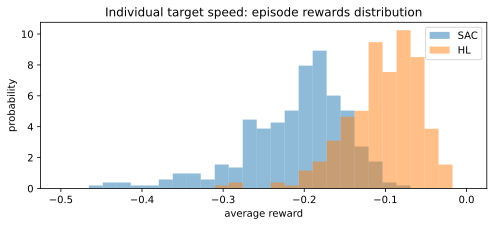

In [14]:
from matplotlib import pyplot as plt

plt.figure(figsize=(8, 3))
bins = np.linspace(-0.5, 0, 30)
plt.hist(sac_rewards.flatten(), bins=bins, density=True, label="SAC", alpha=0.5);
plt.hist(hl_rewards.flatten(), bins=bins, density=True, label="HL", alpha=0.5);
plt.xlabel('average reward')
plt.ylabel('probability');
plt.title('Individual target speed: episode rewards distribution')
plt.legend();

## Varying target speed at runtime

The policy seems to perform well but is it really respecting the target speed? 

We run a simple test where we change target speed at run-time, setting it to the same value for all agents, using a sinusoidal modulation of the agents optimal speed

In [30]:
from navground import core
from typing import Callable

class VaryOptimalSpeed(core.BehaviorModulation):

    def __init__(self, get_time: Callable[[], float]):
        super().__init__()
        self.get_time = get_time
        
    def pre(self, behavior: core.Behavior, time_step: float) -> None:
        behavior.optimal_speed = (np.sin(self.get_time() / 10) + 1) * 0.06
        behavior.optimal_angular_speed = 2 * behavior.optimal_speed / behavior.kinematics.wheel_axis

def init_speed_modulation(world: sim.World, seed: int | None = None) -> None:
    for agent in world.agents:
        agent.behavior.add_modulation(VaryOptimalSpeed(lambda: world.time))

and add it to all agents in the scenario

In [31]:
from navground.learning.evaluation import InitPolicyBehavior
from navground.learning import GroupConfig

test_scenario = sim.load_scenario("""
type: CrossTorus
agent_margin: 0.1
side: 2
groups:
  -
    type: thymio
    number: 10
    radius: 0.1
    control_period: 0.1
    speed_tolerance: 0.02
    kinematics:
      type: 2WDiff
      wheel_axis: 0.094
      max_speed: 0.12
    behavior:
      type: 'HL'
""")

group = GroupConfig(policy=sac.policy, sensor=sensor, 
                    action=action_config, observation=observation_config)
init_policy = InitPolicyBehavior(groups=[group])

In [32]:
world = test_scenario.make_world()
init_policy(world)
init_speed_modulation(world)
display_video(world, time_step=0.1, duration=120, factor=5, relative_margin=0, 
              display_width=400, decorate=decorate)